
## **Text Preprocessing**


### Pre-processing Libraries
### Phase 1:
- `numpy`: Provides a powerful N-dimensional array object and various mathematical operations on arrays.

- `pandas`: Offers high-level data structures and analysis tools for manipulating and analyzing data sets.

- `matplotlib`: A widely used plotting library for creating static, interactive, and animated visualizations in Python.

- `wordcloud`: A library for creating word clouds from text data, where the size of each word is proportional to its frequency in the text.

- `warnings`: A module for filtering and displaying warning messages issued by Python code or modules.

In [1]:
import numpy as np 
import pandas as pd 

import matplotlib.pyplot as plt 
%matplotlib inline 
from wordcloud import WordCloud


import warnings 
warnings.filterwarnings("ignore")


### Phase 2:

- `re`: Python module providing support for regular expressions - a sequence of characters that define a search pattern.
- `sys`: Provides access to some variables used or maintained by the Python interpreter and to functions that interact with the interpreter.
- `unicodedata`: Offers access to the Unicode Character Database (UCD) providing data on individual Unicode characters.
- `emoji`: A Python library for converting emoji to their corresponding shortcodes and vice versa.
- `string`: A module providing a collection of string constants and useful string manipulation functions.
- `nltk`: A leading platform for building Python programs to work with human language data, featuring easy-to-use interfaces to over 50 corpora and lexical resources.
- `sklearn`: A machine learning library providing simple and efficient tools for predictive data analysis, including tools for preprocessing data and encoding categorical features.

In [6]:
import re 
import sys 
import unicodedata
from emoji import demojize, emojize
import string 
import nltk
from nltk.corpus import stopwords 
from nltk.stem import PorterStemmer
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
from sklearn.preprocessing import LabelEncoder, MinMaxScaler


##### Code Explanation

- `Preprocess Class`

    The "Preprocessing" class initializes data from a CSV file and provides two main functions:

    1. `descriptor`: function displays basic dataset information such as the first 5 rows, dataset dimensions, data info, column data types, and statistical information for specific categorical columns.

    2. `visualizer`: function creates visualizations including a pie chart for sentiment distribution, a stacked bar chart for sentiment distribution by entity, and word clouds for tweet contents across different entities.

In [3]:
class Preprocessing:
    def __init__(self, path):
        self.path = path 
        self.df = pd.read_csv(path)
    
    def descriptor(self):
        print(" Basic information from dataset:")
        print("-" * 100)
        print(" First 5 rows dataset")
        print(self.df.head(5))
        print("-" * 100)
        
        print("\n Dimensions of the dataset:")
        print(self.df.shape)
        print("-" * 100)
        
        print("\n Info of the data:")
        print(self.df.info())
        print("-" * 100)

        print("\n Checking the datatypes of the columns")
        print(self.df.dtypes)
        
        print("-" * 100)
        print("\n Statistical information for categorical columns : \n  1. Sentiments ")
        print(self.df['sentiment'].describe())
        print(self.df['sentiment'].value_counts())
        print("." * 100)
        print("   2. Entity")
        print(self.df['entity'].describe())
        print(self.df['entity'].value_counts())
        print("-" * 100)

    def visualizer(self):
        
        print("-" * 100)
        print("\n Sentiment Distribution by Pie chart.\n")
        print("-" * 100)
        category_counts = self.df['sentiment'].value_counts()
        labels = category_counts.index
        sizes = category_counts.values
        # Create a pie chart
        plt.figure(figsize=(8, 8))
        plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=140)
        plt.title('Distribution of sentiment')
        plt.show()

        print("-" * 100)
        print("\n Sentiment Distribution by Entity with Bar chart.\n")
        print("-" * 100)
        # Assuming your data is in a DataFrame called 'df'
        # Grouping by 'entity' and 'sentiment', and calculating the count
        grouped_data = self.df.groupby(['entity', 'sentiment']).size().unstack()

        # Plotting the stacked bar chart
        grouped_data.plot(kind='bar', stacked=True, figsize=(10, 6))
        plt.title('Sentiment Distribution by Entity')
        plt.xlabel('Entity')
        plt.ylabel('Count')
        plt.show()
        print("-" * 100)
        print("\n Sentiment Distribution by Entity with Pie chart.\n")
        print("-" * 100)
        
        print("-" * 100)
        print("\n Word Cloud for all entities base on their  tweet contents.\n")
        print("-" * 100)
        for entity in self.df['entity'].unique():
            # Filter the data for the specific entity
            entity_data = self.df[self.df['entity'] == entity]
            
            # Combine all tweet contexts for the entity into a single string
            text = ' '.join(entity_data["tweetcontent"].astype(str))
            
            # Create the word cloud
            wordcloud = WordCloud(width=800, height=400, random_state=21, max_font_size=110).generate(text)
            
            # Display the word cloud using matplotlib
            plt.figure(figsize=(10, 5))
            plt.imshow(wordcloud, interpolation="bilinear")
            plt.title(f'Word Cloud for {entity}')
            plt.axis('off')
            plt.show()
            
            # Save the word cloud as an image
            image_path = f'/home/asma-rashidian/Documents/DrRahmani_projects/project2-DM-24-Azar-1402/images_results/wordcloud_{entity}.png'
            plt.savefig(image_path, format='png')
            plt.show()


##### Code Explanation

- `Text Preprocess Class`


    This "TextPreprocessing" class is designed to execute various text preprocessing tasks. Here's a breakdown of its functions:

    1. `__init__`: method initializes the class by reading a CSV file into a dataframe and also sets up dictionaries for currency symbols and lists of strange quotes.

    2. `replace_currencies`: method replaces currency symbols within a given input string with their respective 3-letter abbreviations from the predefined dictionary.

    3. `clean_text`: method performs a series of text cleaning operations including replacing strange quotes, converting to lowercase, replacing emojis with their names, removing URLs, emails, phone numbers, numbers, mentions, punctuation, stop words, and performing stemming and lemmatization.

    4. `categorical_to_numerical`: method encodes categorical columns (like "sentiment" and "entity") into numerical values using LabelEncoder.

    5. `preprocess_excutor`: method applies the "clean_text" function to the "tweetcontent" column, encodes categorical columns, displays the first 5 rows of the dataset, and then saves the modified dataset into two separate CSV files for further processing.

    These functions collectively handle a wide range of text preprocessing tasks, making the text data ready for further analysis or modeling.

In [11]:
class TextPreprocessing:
    def __init__(self, path):
        self.df = pd.read_csv(path, index_col="TweetID")
        
        self.CURRENCIES = {
            "$": "USD",
            "£": "GBP",
            "€": "EUR",
        }
        self.strange_double_quotes = [
            "«",
            "‹",
            "»",
            "›",
            "„",
            "“",
            "‟",
            "”",
            "❝",
            "❞",
            "❮",
            "❯",
            "〝",
            "〞",
            "〟",
            "＂",
        ]
        self.strange_single_quotes = ["‘", "‛", "’", "❛", "❜", "`", "´", "‘", "’"]

    def replace_currencies(self, input_string):
                for key, value in self.CURRENCIES.items():
                    input_string = input_string.replace(key, value)
                return input_string
    
    def clean_text(self, text):
        """
        1. Replace strange quotes. 
        """
        text = re.compile("|".join(self.strange_single_quotes)).sub('', text)
        text = re.compile("|".join(self.strange_double_quotes)).sub('', text)

        """
        2. Replace upper case with lower. 
        """
        text = text.lower()

        """
        3. Replace emojies with their name, i.e., ❤️ is red_heart.
        """
        text = demojize(text).replace(":", " ")

        """
        4. Replace Urls.
        """
        text = re.compile(
                r"(?:^|(?<![\w\/\.]))"
                # protocol identifier
                # r"(?:(?:https?|ftp)://)"  <-- alt?
                r"(?:(?:https?:\/\/|ftp:\/\/|www\d{0,3}\.))"
                # user:pass authentication
                r"(?:\S+(?::\S*)?@)?" r"(?:"
                # IP address exclusion
                # private & local networks
                r"(?!(?:10|127)(?:\.\d{1,3}){3})"
                r"(?!(?:169\.254|192\.168)(?:\.\d{1,3}){2})"
                r"(?!172\.(?:1[6-9]|2\d|3[0-1])(?:\.\d{1,3}){2})"
                # IP address dotted notation octets
                # excludes loopback network 0.0.0.0
                # excludes reserved space >= 224.0.0.0
                # excludes network & broadcast addresses
                # (first & last IP address of each class)
                r"(?:[1-9]\d?|1\d\d|2[01]\d|22[0-3])"
                r"(?:\.(?:1?\d{1,2}|2[0-4]\d|25[0-5])){2}"
                r"(?:\.(?:[1-9]\d?|1\d\d|2[0-4]\d|25[0-4]))"
                r"|"
                # host name
                r"(?:(?:[a-z\\u00a1-\\uffff0-9]-?)*[a-z\\u00a1-\\uffff0-9]+)"
                # domain name
                r"(?:\.(?:[a-z\\u00a1-\\uffff0-9]-?)*[a-z\\u00a1-\\uffff0-9]+)*"
                # TLD identifier
                r"(?:\.(?:[a-z\\u00a1-\\uffff]{2,}))" r"|" r"(?:(localhost))" r")"
                # port number
                r"(?::\d{2,5})?"
                # resource path
                r"(?:\/[^\)\]\}\s]*)?",
                flags=re.UNICODE | re.IGNORECASE,
            ).sub(" " , text)
        text = text.replace('�', ' ')
        text = text.replace("\bpic\.twitter\.com/\S+\b", ' ')
        text = re.sub(r'(https?://\S+www\.\S+)', '', text)

        """
        5. Replace Emails.
        """
        text = re.compile(
                r"(?:^|(?<=[^\w@.)]))([\w+-](\.(?!\.))?)*?[\w+-](@|[(<{\[]at[)>}\]])(?:(?:[a-z\\u00a1-\\uffff0-9]-?)*[a-z\\u00a1-\\uffff0-9]+)(?:\.(?:[a-z\\u00a1-\\uffff0-9]-?)*[a-z\\u00a1-\\uffff0-9]+)*(?:\.(?:[a-z\\u00a1-\\uffff]{2,}))",
                flags=re.IGNORECASE | re.UNICODE,
            ).sub(" " , text)
        
        """
        6. Replace Phone numbers.
        """   
        text = re.compile(
                r"((?:^|(?<=[^\w)]))(((\+?[01])|(\+\d{2}))[ .-]?)?(\(?\d{3,4}\)?/?[ .-]?)?(\d{3}[ .-]?\d{4})(\s?(?:ext\.?|[#x-])\s?\d{2,6})?(?:$|(?=\W)))|\+?\d{4,5}[ .-/]\d{6,9}"
            ).sub(" " , text)

        """
        7. Replace Numbers.
        """         
        text =  re.compile(
                r"(?:^|(?<=[^\w,.]))[+–-]?(([1-9]\d{0,2}(,\d{3})+(\.\d*)?)|([1-9]\d{0,2}([ .]\d{3})+(,\d*)?)|(\d*?[.,]\d+)|\d+)(?:$|(?=\b))"
            ).sub(" " , text)
        
        """
        8. Replace all Currency symbols in ``text`` with 3-letter abbreviations.
        Args:
            text (str): raw text
            replace_with (str): if None (default), replace symbols with
                their standard 3-letter abbreviations (e.g. '$' with 'USD', '£' with 'GBP');
                otherwise, pass in a string with which to replace all symbols
                (e.g. "*CURRENCY*")
        """
        text = self.replace_currencies(text)

        """
        9. Replace Mentions.
        """
        text = re.sub(r'@\w+|@ \w+|@', '', text)
        
        """
        10. Replace one or more spacings with a single space.
        """
        text = re.sub(r'\s+', ' ', text)

        """
        11. Replace Punctuations.
        """
        text = re.sub(r'[\\|"|.|,|(|)|{|}|\[|\]|?|!|<|>]', '', text)
        text = re.sub(r'( - )(--)(/)(\\)', '', text)      
        text = re.sub(r"\s*\/\s*|-\s*|\s*-|\s-\s|\.", '', text)
        text = re.sub(r"\#|\.\.\.|\+|\=|_|…", "", text)

        """
        12. Replace Stop words.
        """
        # Assuming your text is in a variable called 'text'
        # Download the English stopwords list if you haven't already
        nltk.download('stopwords')
        # Get a list of English stopwords
        stop_words = stopwords.words('english')
        # Remove stop words from the text
        text = ' '.join([word for word in text.split() if word not in stop_words])

        """
        12. Stemming.
        """
        # Tokenize the text into words
        words = word_tokenize(text)

        # Create a stemmer
        stemmer = PorterStemmer()

        # Stem each word in the text
        text = " ".join([stemmer.stem(word) for word in words])

        """
        13. Lemmatization.
        """
        nltk.download('punkt')
        nltk.download('wordnet')
        # Tokenize the text into words
        words = word_tokenize(text)
        # Create a lemmatizer
        lemmatizer = WordNetLemmatizer()
        # Lemmatize each word in the text
        text = " ".join([lemmatizer.lemmatize(word) for word in words])

        return text 

    def categorical_to_numerical(self):
        label_encoder = LabelEncoder()
        self.df["sentiment"] = label_encoder.fit_transform(self.df["sentiment"])
        self.df["entity"] = label_encoder.fit_transform(self.df["entity"])
         

    
    def preprocess_excutor(self, x_save_path, y_save_path):
        self.df["tweetcontent"] = self.df["tweetcontent"].apply(lambda text: self.clean_text(str(text)))
        self.categorical_to_numerical()
        print(" Basic information from dataset:")
        print("-" * 100)
        print(" First 5 rows dataset")
        print(self.df.head(5))
        print("-" * 100)

        self.df["sentiment"].to_csv(y_save_path, index="TweetID")
        self.df.drop(['sentiment'], axis=1).to_csv(x_save_path, index="TweetID")


### Train dataset Descriptions :

 Basic information from dataset:
----------------------------------------------------------------------------------------------------
 First 5 rows dataset
   TweetID       entity sentiment  \
0     2401  Borderlands  Positive   
1     2401  Borderlands  Positive   
2     2401  Borderlands  Positive   
3     2401  Borderlands  Positive   
4     2401  Borderlands  Positive   

                                        tweetcontent  
0  im getting on borderlands and i will murder yo...  
1  I am coming to the borders and I will kill you...  
2  im getting on borderlands and i will kill you ...  
3  im coming on borderlands and i will murder you...  
4  im getting on borderlands 2 and i will murder ...  
----------------------------------------------------------------------------------------------------

 Dimensions of the dataset:
(74682, 4)
----------------------------------------------------------------------------------------------------

 Info of the data:
<class 'pandas.core.frame.Dat

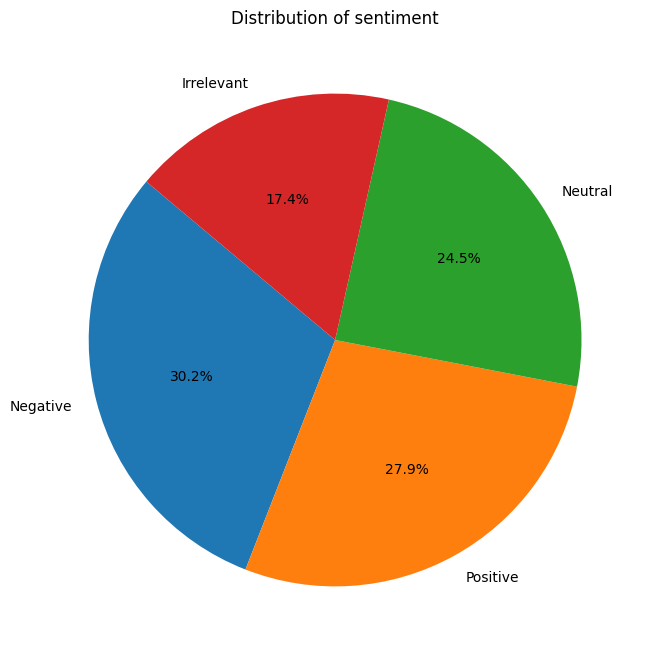

----------------------------------------------------------------------------------------------------

 Sentiment Distribution by Entity with Bar chart.

----------------------------------------------------------------------------------------------------


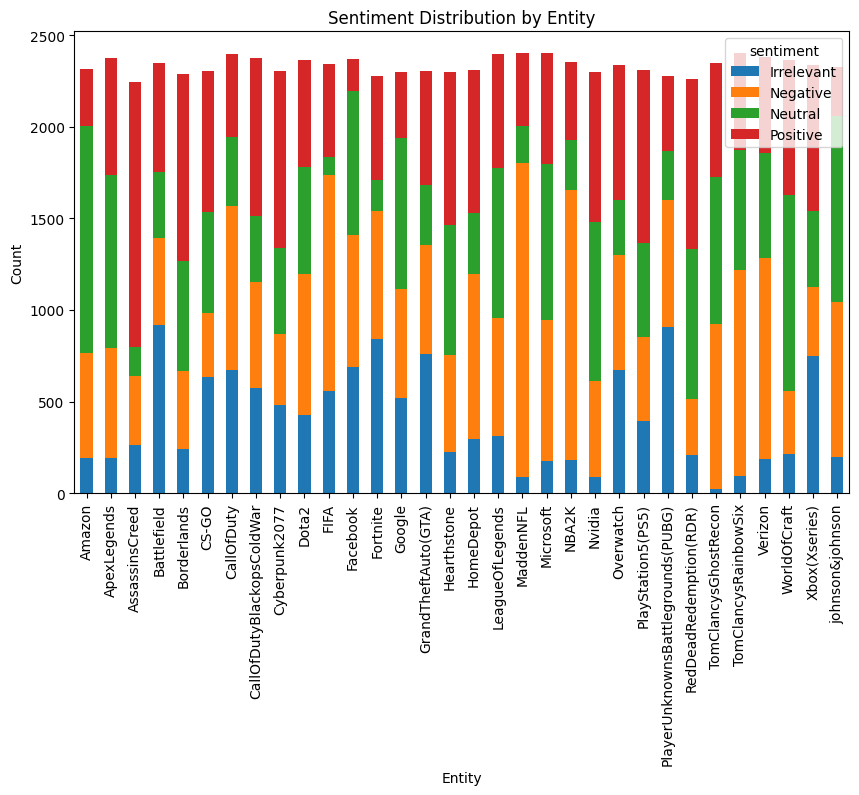

----------------------------------------------------------------------------------------------------

 Sentiment Distribution by Entity with Pie chart.

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

 Word Cloud for all entities base on their  tweet contents.

----------------------------------------------------------------------------------------------------


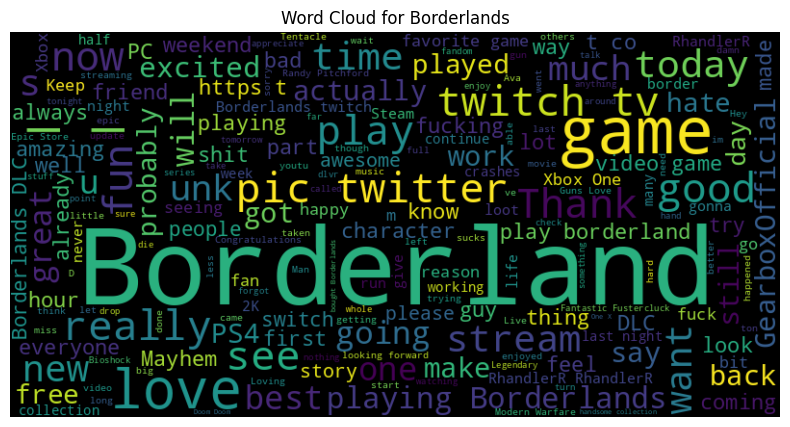

<Figure size 640x480 with 0 Axes>

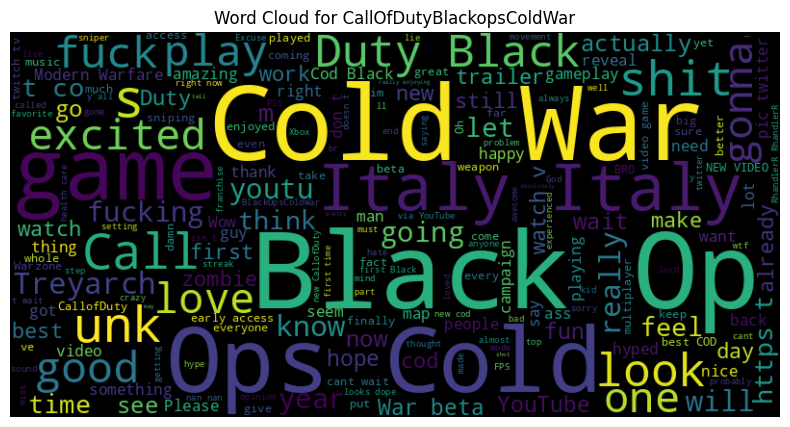

<Figure size 640x480 with 0 Axes>

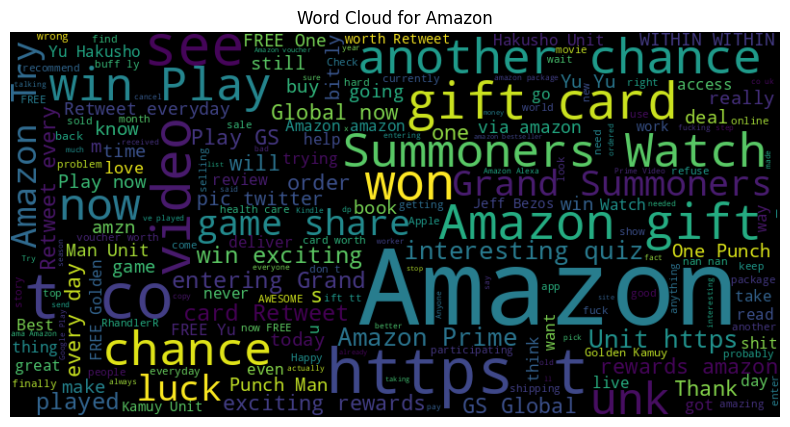

<Figure size 640x480 with 0 Axes>

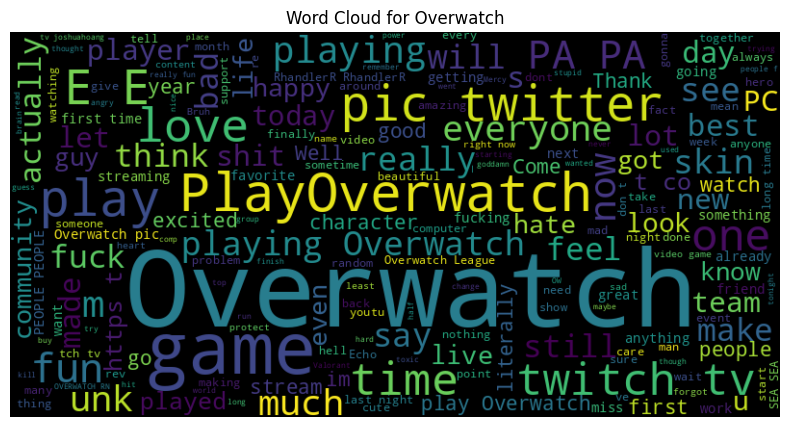

<Figure size 640x480 with 0 Axes>

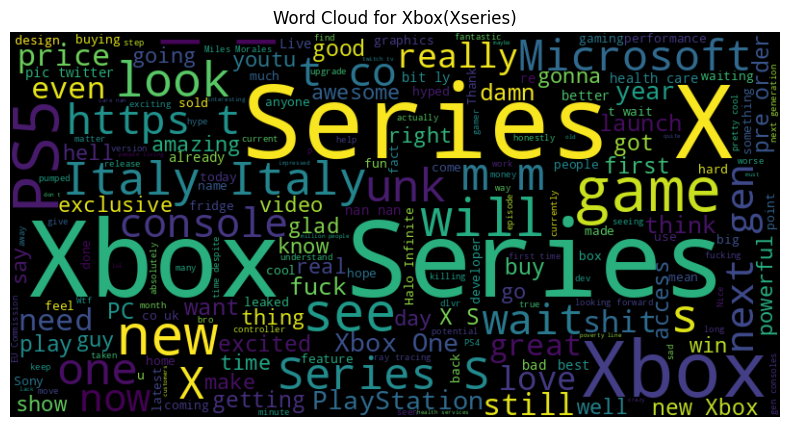

<Figure size 640x480 with 0 Axes>

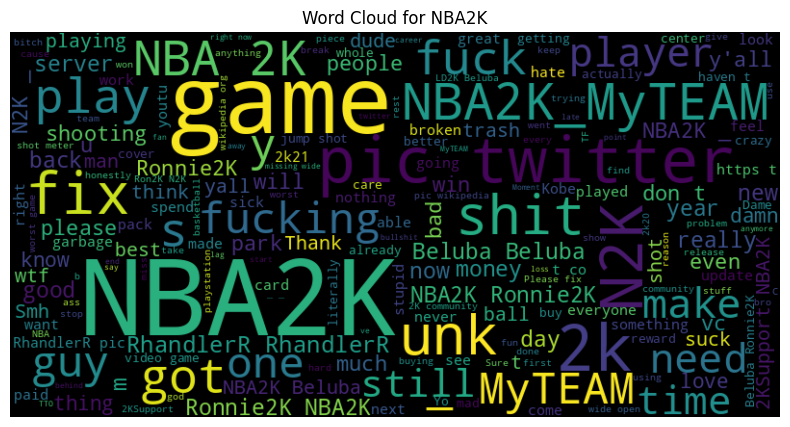

<Figure size 640x480 with 0 Axes>

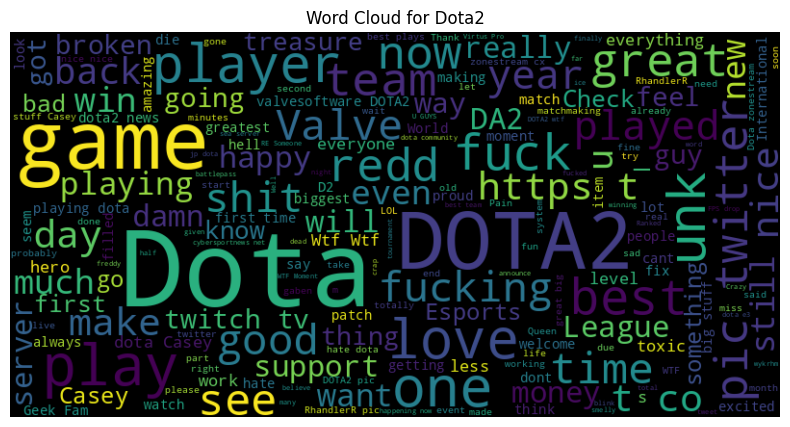

<Figure size 640x480 with 0 Axes>

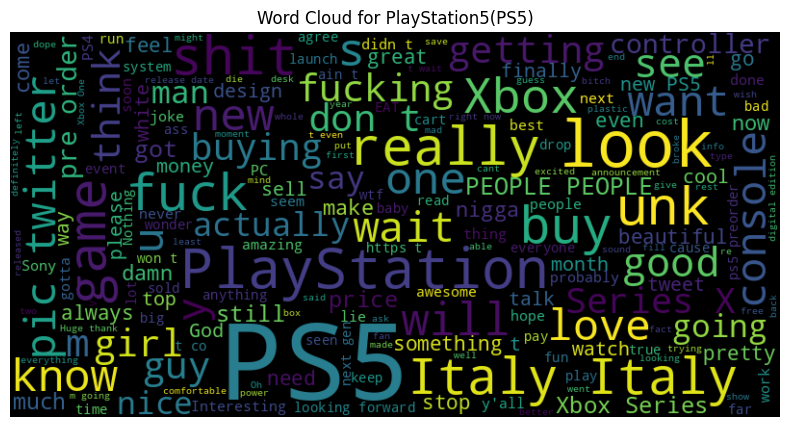

<Figure size 640x480 with 0 Axes>

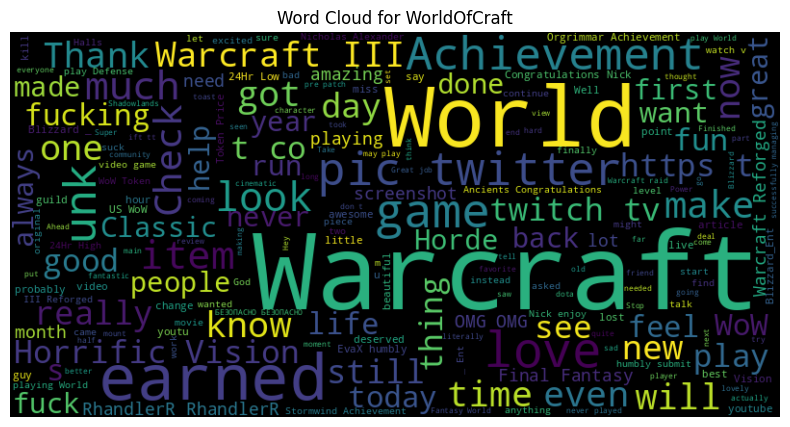

<Figure size 640x480 with 0 Axes>

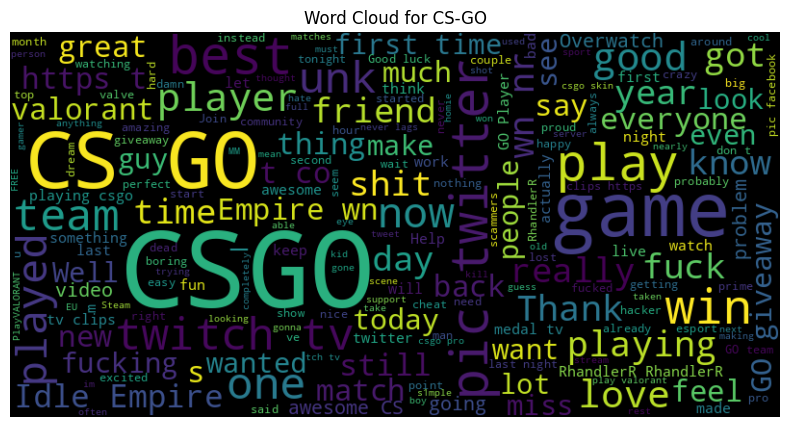

<Figure size 640x480 with 0 Axes>

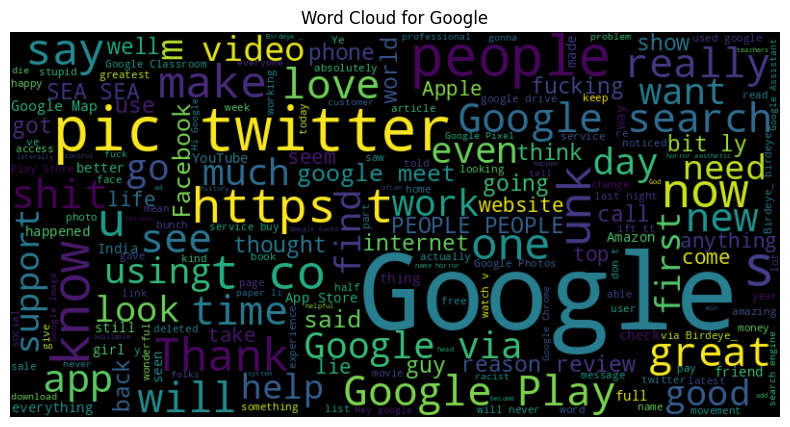

<Figure size 640x480 with 0 Axes>

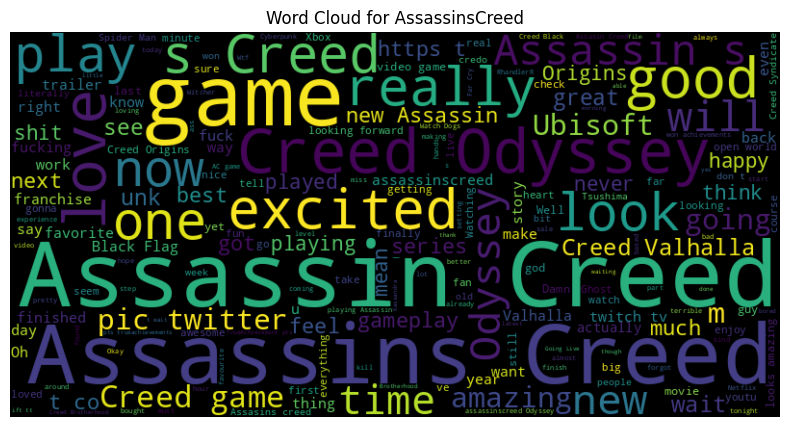

<Figure size 640x480 with 0 Axes>

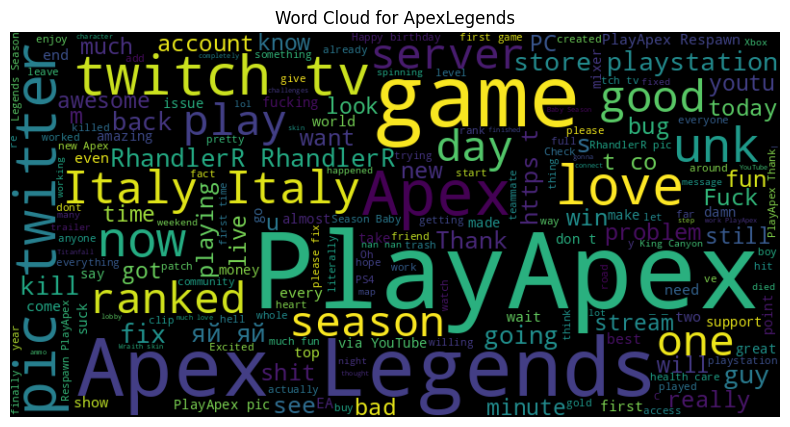

<Figure size 640x480 with 0 Axes>

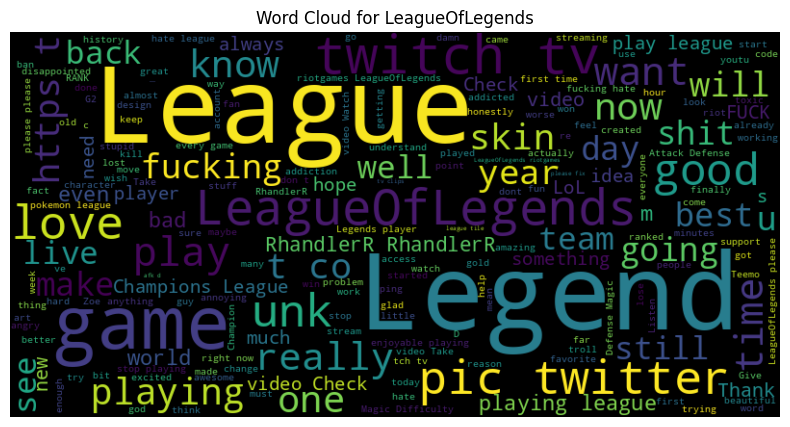

<Figure size 640x480 with 0 Axes>

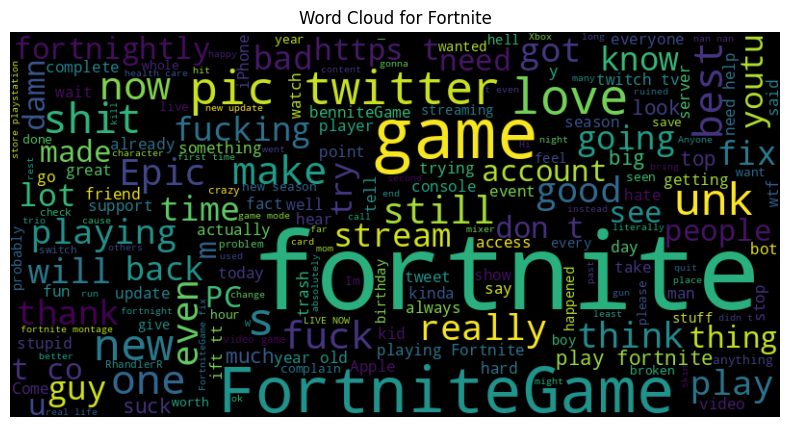

<Figure size 640x480 with 0 Axes>

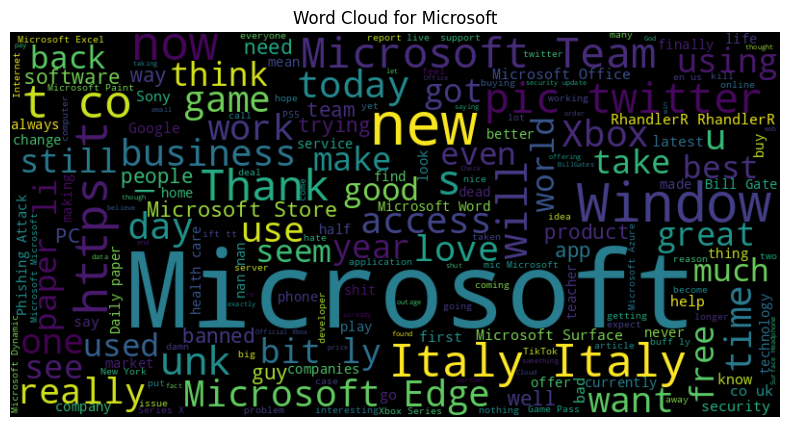

<Figure size 640x480 with 0 Axes>

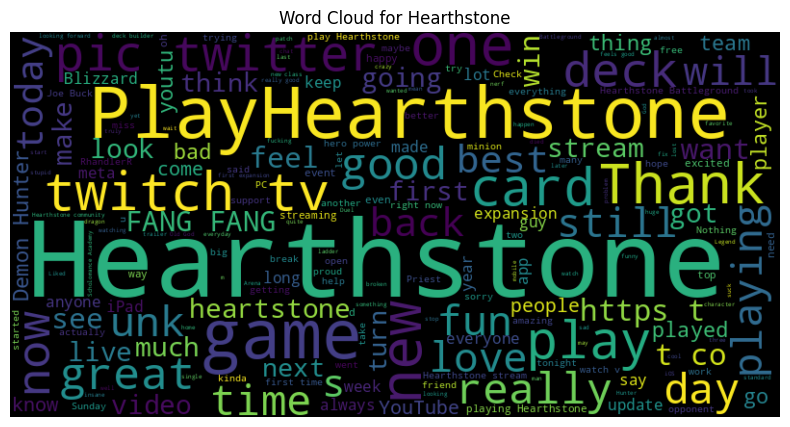

<Figure size 640x480 with 0 Axes>

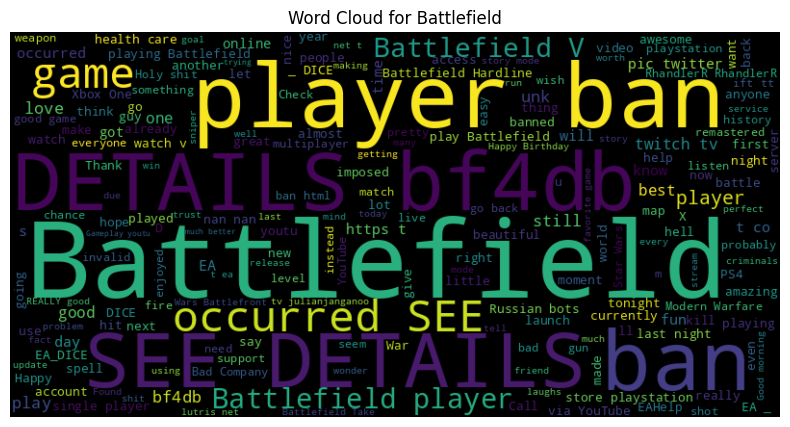

<Figure size 640x480 with 0 Axes>

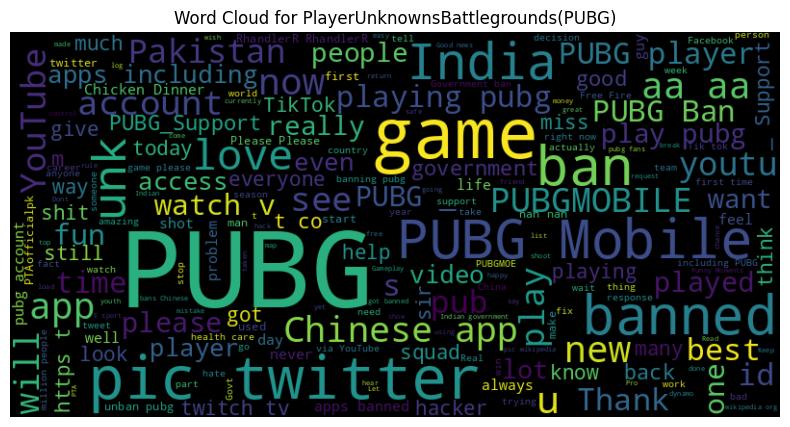

<Figure size 640x480 with 0 Axes>

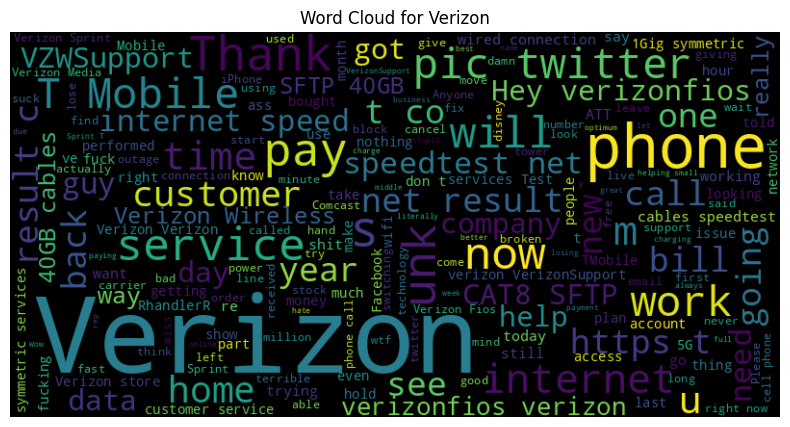

<Figure size 640x480 with 0 Axes>

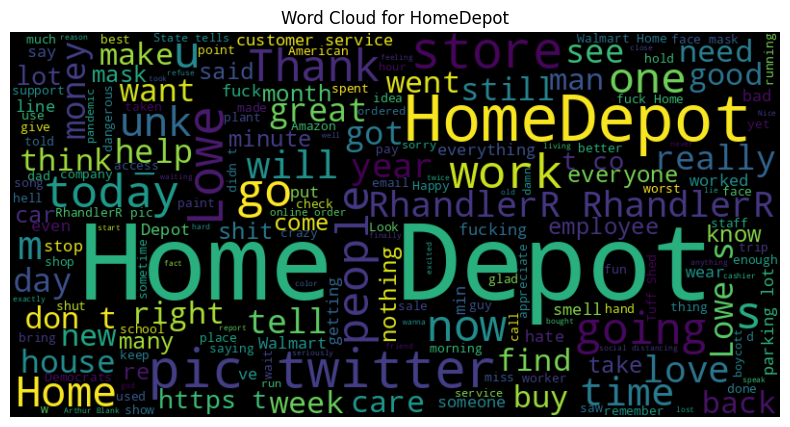

<Figure size 640x480 with 0 Axes>

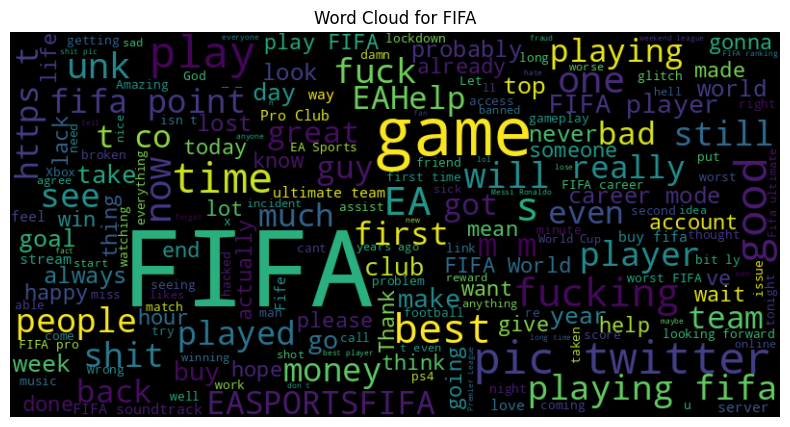

<Figure size 640x480 with 0 Axes>

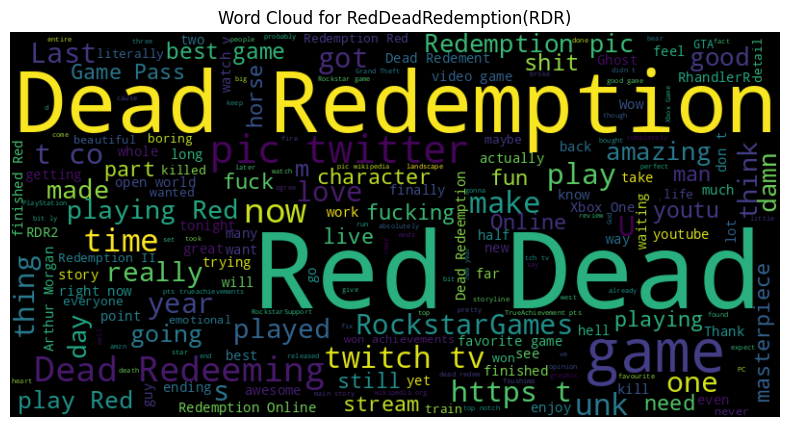

<Figure size 640x480 with 0 Axes>

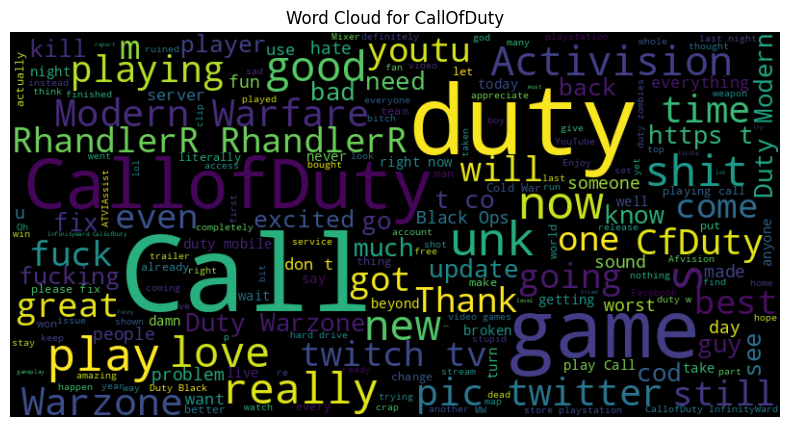

<Figure size 640x480 with 0 Axes>

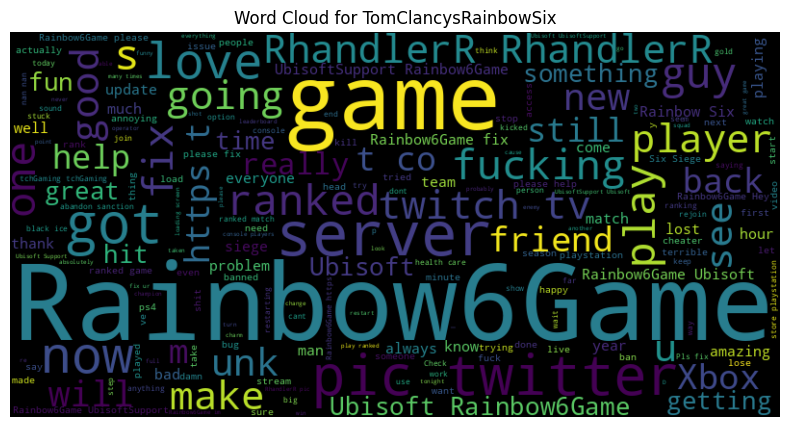

<Figure size 640x480 with 0 Axes>

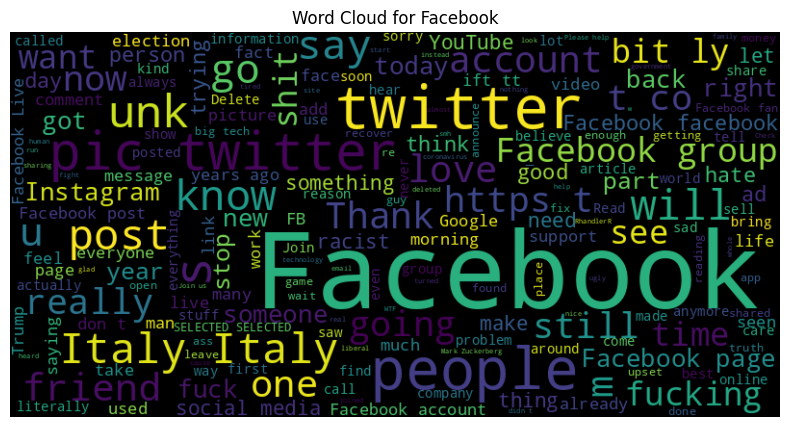

<Figure size 640x480 with 0 Axes>

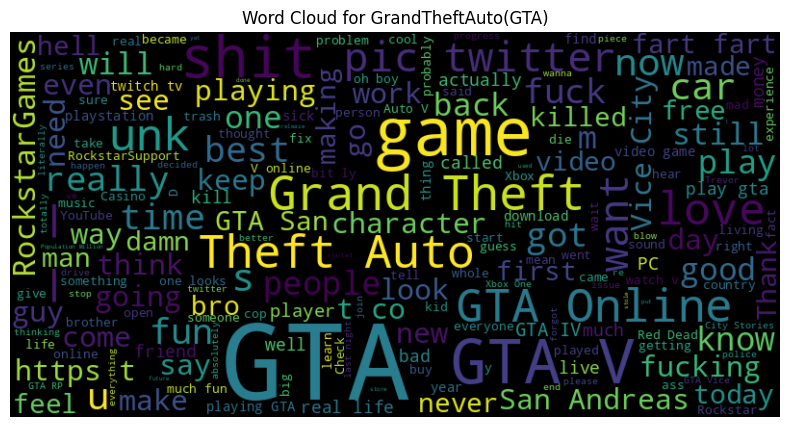

<Figure size 640x480 with 0 Axes>

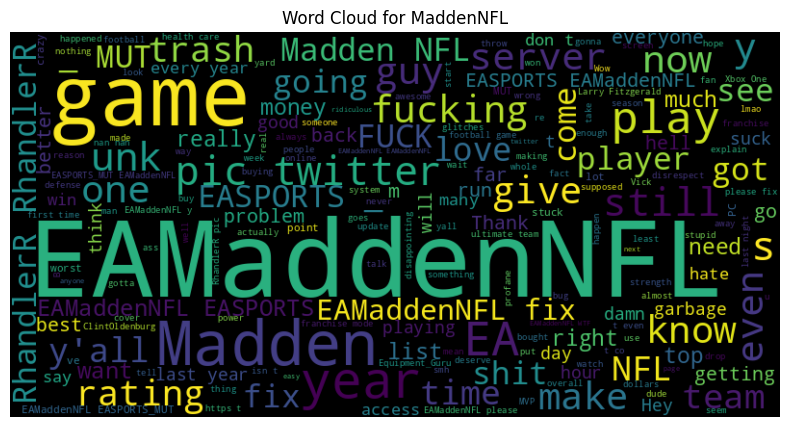

<Figure size 640x480 with 0 Axes>

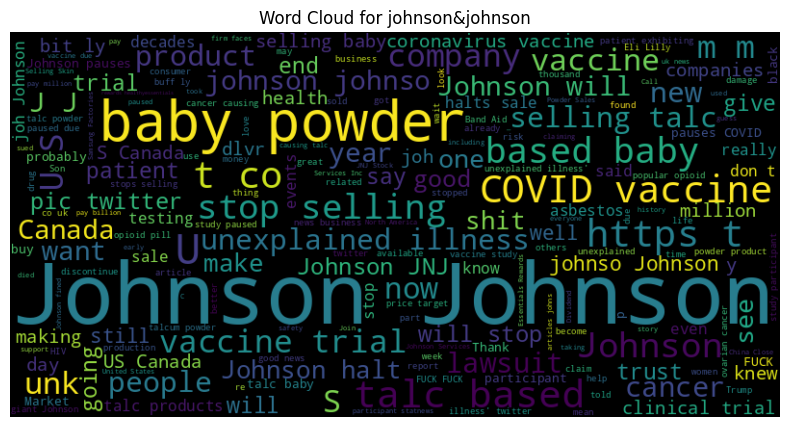

<Figure size 640x480 with 0 Axes>

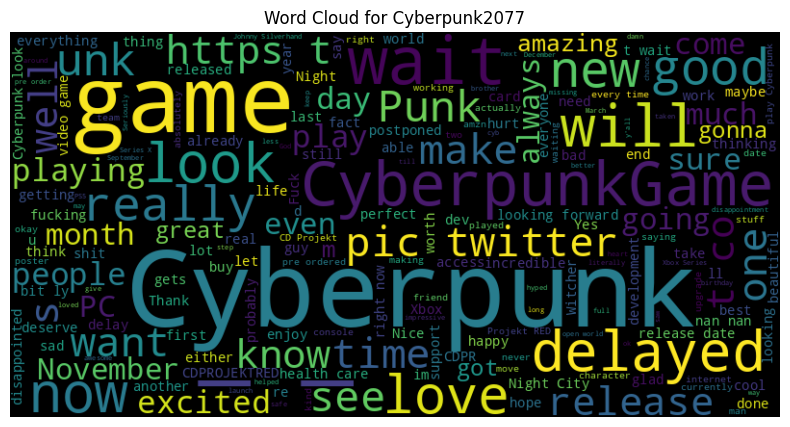

<Figure size 640x480 with 0 Axes>

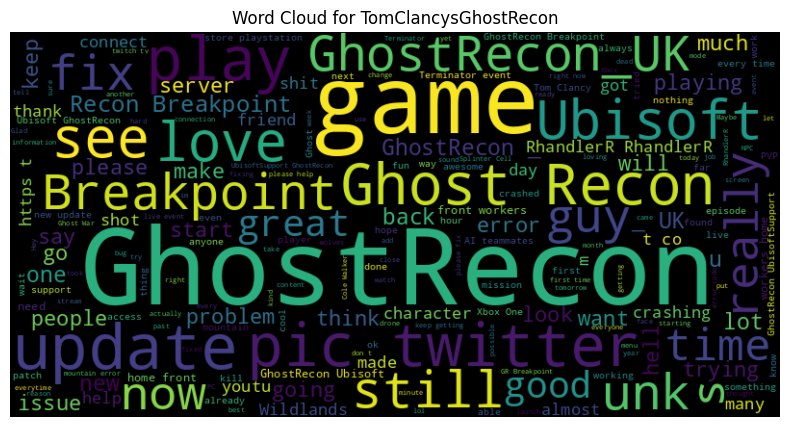

<Figure size 640x480 with 0 Axes>

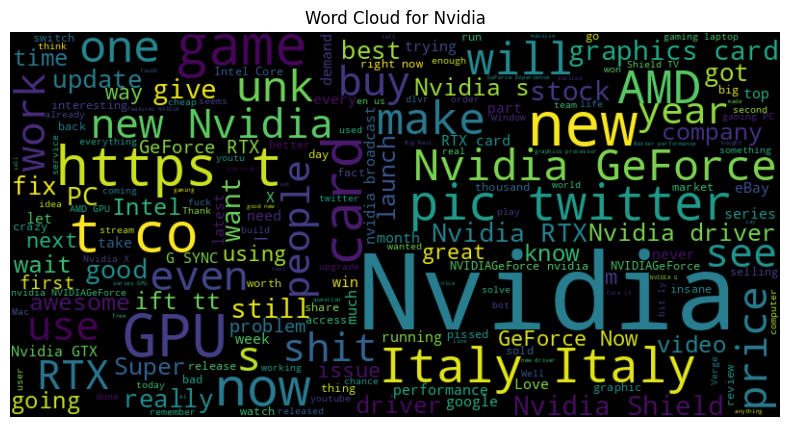

<Figure size 640x480 with 0 Axes>

In [12]:
path = "/home/asma-rashidian/Documents/DrRahmani_projects/project2-DM-24-Azar-1402/dataset/raw/twitter_training.csv"
preprocess = Preprocessing(path=path)
preprocess.descriptor()
preprocess.visualizer()

### Save preprocessed data for all Datasets

`twitter_training`

`twitter_test`

`twitter_validation`

In [ ]:
path = "/home/asma-rashidian/Documents/DrRahmani_projects/project2-DM-24-Azar-1402/dataset/raw/twitter_training.csv"
x_save_path = "/home/asma-rashidian/Documents/DrRahmani_projects/project2-DM-24-Azar-1402/dataset/processed/x_twitter_training.csv"
y_save_path = "/home/asma-rashidian/Documents/DrRahmani_projects/project2-DM-24-Azar-1402/dataset/processed/y_twitter_training.csv"

text_preprocess = TextPreprocessing(path) 
text_preprocess.preprocess_excutor(x_save_path, y_save_path)

In [ ]:
path = "/home/asma-rashidian/Documents/DrRahmani_projects/project2-DM-24-Azar-1402/dataset/raw/twitter_test.csv"
x_save_path = "/home/asma-rashidian/Documents/DrRahmani_projects/project2-DM-24-Azar-1402/dataset/processed/x_twitter_test.csv"
y_save_path = "/home/asma-rashidian/Documents/DrRahmani_projects/project2-DM-24-Azar-1402/dataset/processed/y_twitter_test.csv"


text_preprocess = TextPreprocessing(path) 
text_preprocess.preprocess_excutor(x_save_path, y_save_path)

In [ ]:
path = "/home/asma-rashidian/Documents/DrRahmani_projects/project2-DM-24-Azar-1402/dataset/raw/twitter_validation.csv"
x_save_path = "/home/asma-rashidian/Documents/DrRahmani_projects/project2-DM-24-Azar-1402/dataset/processed/x_twitter_validation.csv"
y_save_path = "/home/asma-rashidian/Documents/DrRahmani_projects/project2-DM-24-Azar-1402/dataset/processed/y_twitter_validation.csv"


text_preprocess = TextPreprocessing(path) 
text_preprocess.preprocess_excutor(x_save_path, y_save_path)